In [3]:
from mu2e import mu2e_ext_path
from mu2e.dataframeprod import g4root_to_df
from root_pandas import read_root
import pandas as pd
from mu2e.mu2eplots import mu2e_plot3d_ptrap
from mu2e.mu2eplots import mu2e_plot3d_ptrap_traj
from mu2e.mu2eplots import mu2e_plot3d_ptrap_anim
import mu2e.mu2eplots as mplt
import six.moves.cPickle as pkl
%matplotlib inline
plt.rcParams['figure.figsize'] = (12,8)
mu2e_data_path = '/Volumes/DataDump/Mu2E/'
from skhep.visual import MplPlotter as splt

In [5]:
# Get pions, make a subset df of matching pions and muons

df_ntpart, _, _ = g4root_to_df(mu2e_data_path+'pion-st-Mau12/nts.bpollack.pions_Mau12_stage1_vd.v650p.combined',
do_basic_modifications=True, trees=['part'])
df_ntpart.set_index(['run', 'subrun', 'evt'], inplace=True)

df_mu_and_pi = df_ntpart.loc[df_ntpart.query('pdg==-211').index]
df_mu_and_pi = df_mu_and_pi.loc[df_mu_and_pi.query('pdg==13').index]

In [15]:
store_xray = pd.HDFStore(mu2e_data_path+'G4ParticleSim/low_e_ele_0T_v580.h5')
df_xray = store_xray.df_ntpart
store_xray.close()

In [19]:
mu2e_plot3d_ptrap(df_ntpart.query('pdg==-211').reset_index().iloc[0:10000],
                  'zstop','xstop','ystop', x_range=[3700,17500], y_range = [-1000,1000], z_range=[-1000,1000], save_name=None,
                   df_xray=df_xray, color='p', title='Pion position at time of death')

binning...
binned


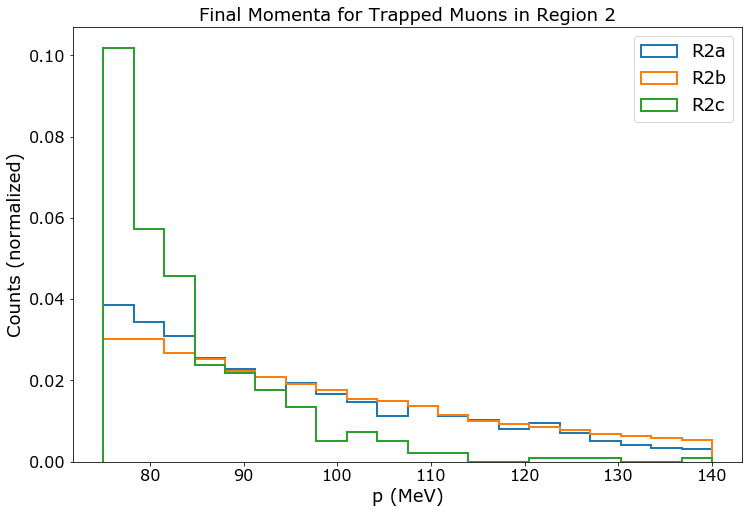

In [26]:
splt.hist(df_mu_r2.query('9700<zstop<10000').pstop, normed=True, range=(75,140), bins=20, histtype='step', label='R2a')
splt.hist(df_mu_r2.query('11570<zstop').pstop.values, normed=True, range=(75,140), bins=20, histtype='step', label='R2b')
splt.hist(df_mu_r2.query('10000<zstop<11570').pstop.values, normed=True, range=(75,140), bins=20, histtype='step', label='R2c')
plt.ylabel('Counts (normalized)')
plt.xlabel('p (MeV)')
plt.title('Final Momenta for Trapped Muons in Region 2')
plt.legend()

# Observations

There seem to be three distinct regions (with sub regions?) in which particles can become trapped.

    1) Low Z region: Around the OPA.
        a) Primary Ring at Z=~5000
        b) Secondary Ring at Z=~5660
        c) Tertiary Ring? at Z=~6300
    2) Tracker section:
        a) Primary Group at 9200<Z<11000
        b) Secondary Group at Z=~11700
    3) Calo section:
        a) Single group at Z=~13000

ValueError: zero-size array to reduction operation minimum which has no identity

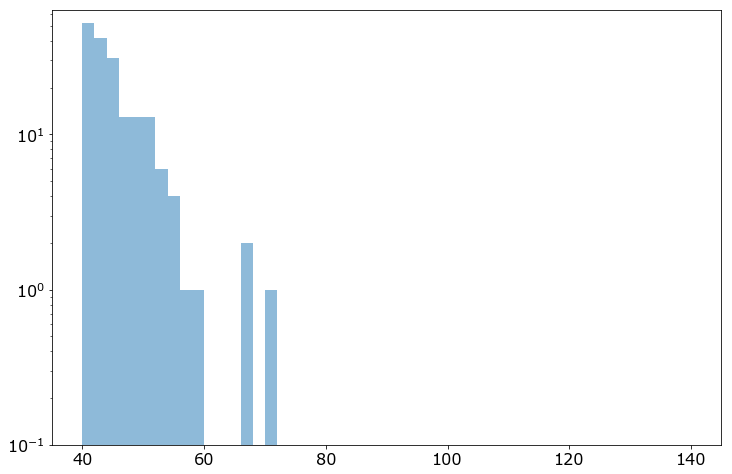

In [18]:
_ = splt.hist(df_mu.query('zstop<7000').p.values, range=(40,140), bins=50, label='Initial P', log=True)
_ = splt.hist(df_mu.query('zstop<7000').pstop.values, range=(40,140), bins=50, label='Final P', histtype='step', log=True)
plt.legend()
plt.title('Trapped Muons, Z<7000')
plt.xlabel('Momentum (GeV)')
plt.ylabel('Count')


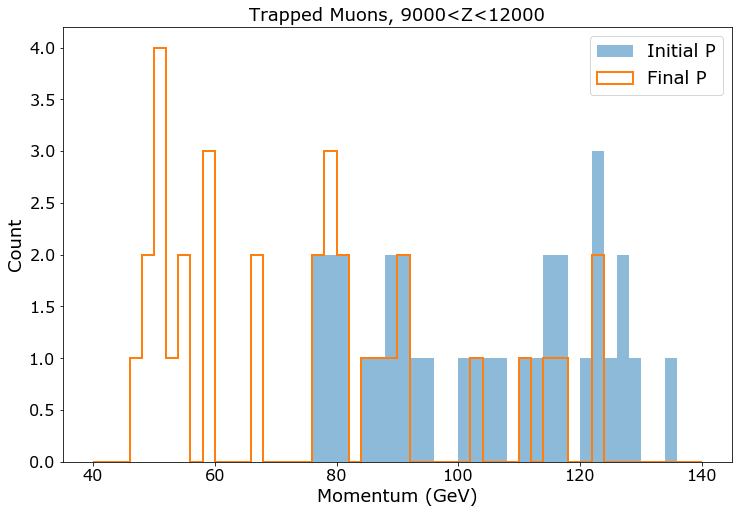

In [24]:
_ = splt.hist(df_mu.query('9000<zstop<12000').p.values, range=(40,140), bins=50, label='Initial P')
_ = splt.hist(df_mu.query('9000<zstop<12000').pstop.values, range=(40,140), bins=50, label='Final P', histtype='step')
plt.legend()
plt.title('Trapped Muons, 9000<Z<12000')
plt.xlabel('Momentum (GeV)')
plt.ylabel('Count')

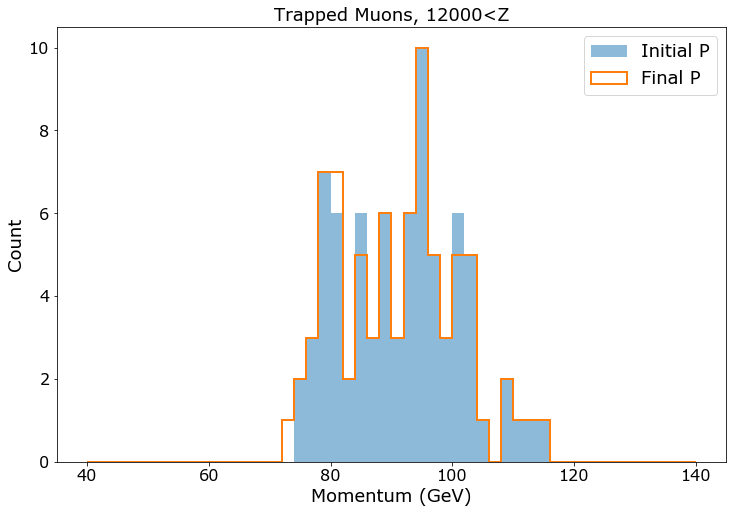

In [25]:
_ = splt.hist(df_mu.query('12000<zstop').p.values, range=(40,140), bins=50, label='Initial P')
_ = splt.hist(df_mu.query('12000<zstop').pstop.values, range=(40,140), bins=50, label='Final P', histtype='step')
plt.legend()
plt.title('Trapped Muons, 12000<Z')
plt.xlabel('Momentum (GeV)')
plt.ylabel('Count')

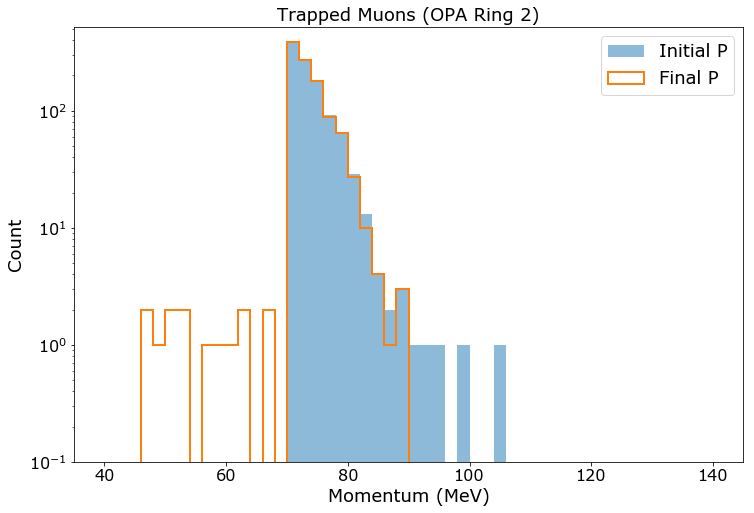

In [14]:
_ = splt.hist(df_mu_r1.query('zstop>5350').p.values, range=(40,140), bins=50, label='Initial P', log=True)
_ = splt.hist(df_mu_r1.query('zstop>5350').pstop.values, range=(40,140), bins=50, label='Final P', histtype='step', log=True)
plt.legend()
plt.title('Trapped Muons (OPA Ring 2)')
plt.xlabel('Momentum (MeV)')
plt.ylabel('Count')

# Data Munging

In [47]:
df_ntpart.set_index(['run', 'subrun', 'evt'], inplace=True)

In [48]:
df_mu_and_pi = df_ntpart.loc[df_ntpart.query('pdg==-211').index]

In [50]:
df_mu_and_pi = df_mu_and_pi.loc[df_mu_and_pi.query('pdg==13').index]

In [51]:
df_mu_and_pi

trk  pdg        time  gtime           x           y  \
run subrun evt                                                          
1   0      166      1 -211    0.000000    0.0   71.532227   -5.370462   
           166      3   13  119.654404    0.0  -42.083008   64.845940   
           371      1 -211    0.000000    0.0   32.189941  -68.185555   
           371      3   13  106.104317    0.0 -134.334961   58.195557   
           429      1 -211    0.000000    0.0  -72.973145  -50.915703   
           429      5   13  104.033691    0.0 -103.833252  308.850922   
           431      1 -211    0.000000    0.0  -47.526855  -48.199001   
           431      3   13  220.988327    0.0  224.350830 -163.762238   
           436      1 -211    0.000000    0.0  -58.055176   68.187416   
           436     11   13  138.113495    0.0  -81.299561  133.656540   
           461      1 -211    0.000000    0.0  -26.999023  -39.448875   
           461      3   13  109.207016    0.0  -37.208984 -356.463593   
           505      1 -211    0.000000    0.0  -10.314453  -64.491638   
           505      3   13  121.970985    0.0  -17.908936  -70.888939   
           519      1 -211    0.000000    0.0  -17.624023   18.363029   
           519     17   13  115.102913    0.0   24.510010  240.021744   
           530      1 -211    0.000000    0.0  -26.916504   33.181957   
           530      3   13  127.900948    0.0   33.303223  181.558624   
           544      1 -211    0.000000    0.0  -43.517334  -48.681824   
           544      3   13  102.273407    0.0  209.410645  214.371460   
           762      1 -211    0.000000    0.0   41.924805   32.937466   
           762      3   13  113.201790    0.0 -350.924805  107.310448   
           834      1 -211    0.000000    0.0   71.679688  -52.403667   
           834      3   13  156.942474    0.0  104.176758 -136.436325   
           874      1 -211    0.000000    0.0  -52.219238   68.877785   
           874      3   13  139.156296    0.0 -151.932373 -100.445145   
           970      1 -211    0.000000    0.0  -71.000977   -9.729383   
           970      3   13  181.603455    0.0 -186.307373  -26.071646   
           1016     1 -211    0.000000    0.0   73.150391  -36.225315   
           1016     3   13  108.497833    0.0  335.893555  -19.682520   
...               ...  ...         ...    ...         ...         ...   
    399    98955    1 -211    0.000000    0.0   29.940186   21.472692   
           98955    3   13  149.701981    0.0  -94.070801    1.089915   
           98964    1 -211    0.000000    0.0  -49.866943    8.296493   
           98964    5   13  124.552315    0.0 -241.288574  247.284714   
           99012    1 -211    0.000000    0.0   12.368408   24.453423   
           99012    3   13  116.085838    0.0   28.768555  -30.000183   
           99106    1 -211    0.000000    0.0   25.173828   56.674503   
           99106    3   13  121.023018    0.0  168.082520 -138.667648   
           99138    1 -211    0.000000    0.0  -73.244385   44.921906   
           99138    6   13  107.334877    0.0 -286.520508  -28.640623   
           99153    1 -211    0.000000    0.0   66.886230   -2.948087   
           99153    3   13  122.168068    0.0   82.158691    2.291181   
           99310    1 -211    0.000000    0.0  -16.675293   70.498245   
           99310    3   13  106.015663    0.0  123.011719  211.710556   
           99386    1 -211    0.000000    0.0  -40.362549   -6.422085   
           99386    3   13  116.135635    0.0  -73.152100    6.222019   
           99408    1 -211    0.000000    0.0   -6.282959   17.685280   
           99408    3   13  132.360184    0.0  -76.268799 -146.682632   
           99566    1 -211    0.000000    0.0  -73.349365   13.192016   
           99566    3   13  103.395203    0.0    7.693359  204.705429   
           99631    1 -211    0.000000    0.0   29.438477   61.156609   
           99631    5   13  113.827934    0.0   49.867432  200.810333   
   

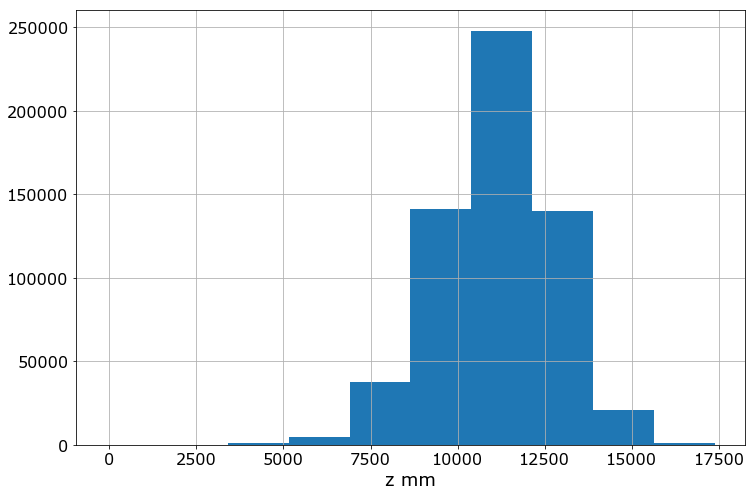

In [53]:
df_mu_and_pi.query('pdg==-211').zstop.hist()
plt.xlabel('z mm')

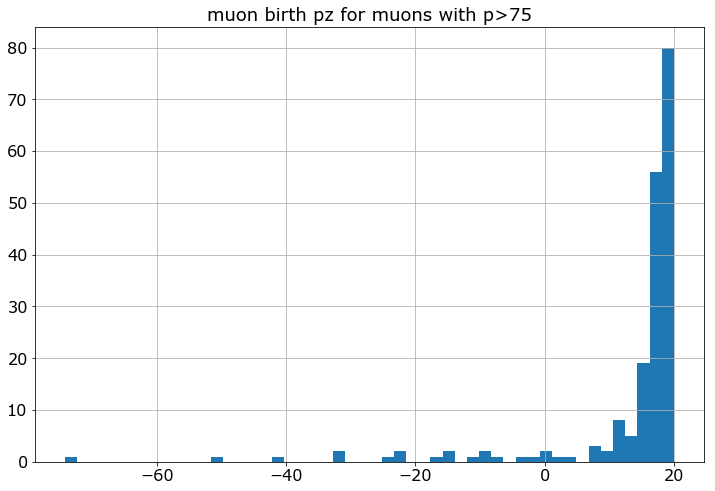

In [63]:
df_mu_and_pi.query('pdg==13 and p>75 and pz<20').pz.hist(bins=50)
plt.title('muon birth pz for muons with p>75')

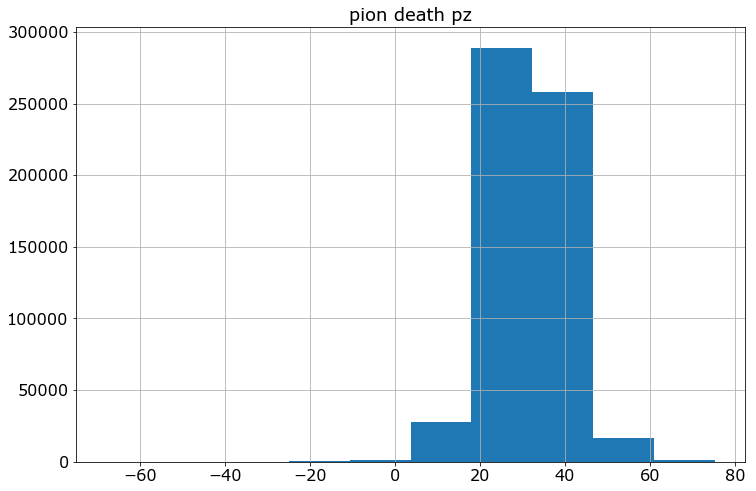

In [64]:
df_mu_and_pi.query('pdg==-211').pzstop.hist()
plt.title('pion death pz')

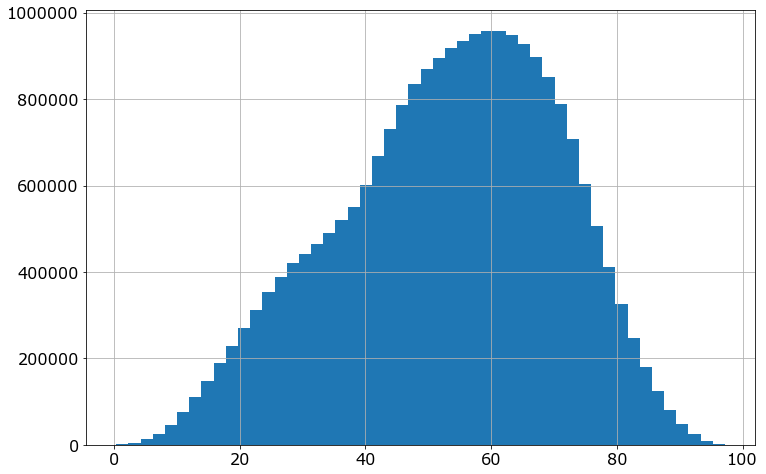

In [7]:
df_ntpart.query('pdg==13').p.hist(bins=50)

In [4]:
# Region 2

df_ntpart, _, _ = g4root_to_df(mu2e_data_path+'muon-r2-Mau12/nts.bpollack.iso_muons_Mau12_stage1_vd.v633.combined_r2',
do_basic_modifications=True, trees=['part'])
df_mu = df_ntpart.query('pdg==13 and tstop>700').reset_index()
df_mu.name = 'Muons'
df_mu.to_pickle('mau12_700ns_r2.p')

In [5]:
# Region 3

df_ntpart, _, _ = g4root_to_df(mu2e_data_path+'muon-r3-Mau12/nts.bpollack.iso_muons_Mau12_stage1_vd.v633.combined_r3',
do_basic_modifications=True, trees=['part'])
df_mu = df_ntpart.query('pdg==13 and tstop>700').reset_index()
df_mu.name = 'Muons'
df_mu.to_pickle('mau12_700ns_r3.p')

In [2]:
# Region 2a

df_ntpart, _, _ = g4root_to_df(mu2e_data_path+'muon-r2a-Mau12/nts.bpollack.iso_muons_Mau12_stage1_vd.v633.combined_r2a',
do_basic_modifications=True, trees=['part'])
df_mu = df_ntpart.query('pdg==13 and tstop>700').reset_index()
df_mu.name = 'Muons'
df_mu.to_pickle('mau12_700ns_r2a.p')


In [2]:
# Region 2a (finetime)

df_ntpart_ft, df_nttvd_ft, _ = g4root_to_df(mu2e_data_path+'muon-r2a-Mau12/nts.bpollack.iso_muons_Mau12_stage1_vd.v633.finetime_r2a',
do_basic_modifications=True, trees=['part', 'tvd'])

In [2]:
# Region 2b

df_ntpart, _, _ = g4root_to_df(mu2e_data_path+'muon-r2b-Mau12/nts.bpollack.iso_muons_Mau12_stage1_vd.v633.combined_r2b',
do_basic_modifications=True, trees=['part'])
df_mu = df_ntpart.query('pdg==13 and tstop>700').reset_index()
df_mu.name = 'Muons'
df_mu.to_pickle('mau12_700ns_r2b.p')


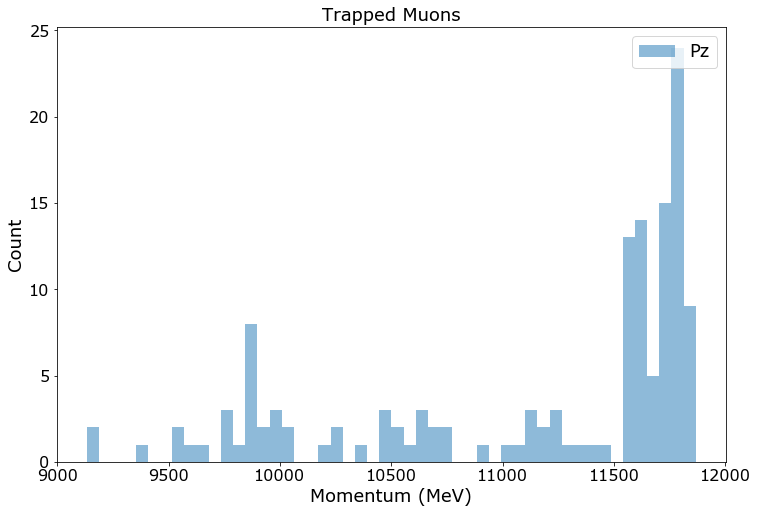

In [8]:
_ = splt.hist(df_mu_r2.pz.values, bins=50, label='Pz')
plt.legend()
plt.title('Trapped Muons')
plt.xlabel('Momentum (MeV)')
plt.ylabel('Count')

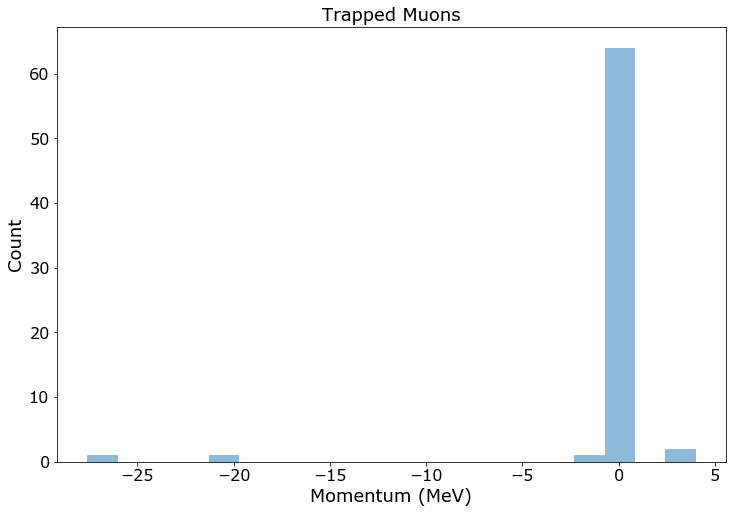

In [20]:
_ = splt.hist(df_mu_r2.query('pstop>75 and z>10700').pz.values, bins=20)
plt.legend()
plt.title('Trapped Muons')
plt.xlabel('Momentum (MeV)')
plt.ylabel('Count')

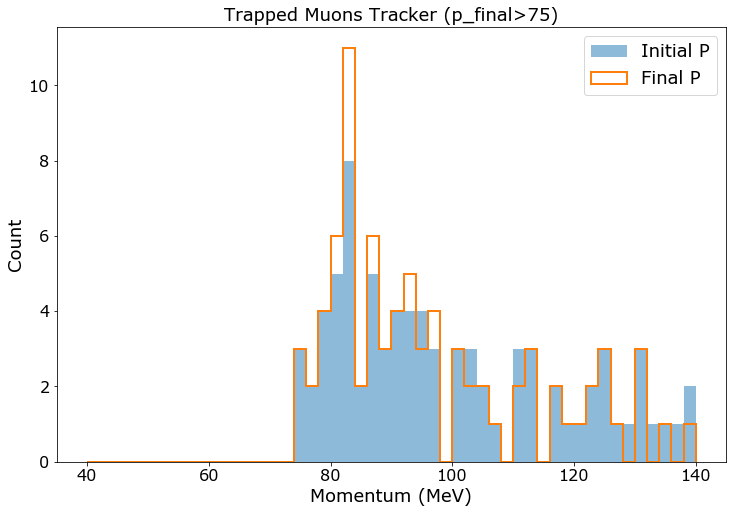

In [13]:
_ = splt.hist(df_mu_r2.query('pstop>75').p.values, range=(40,140), bins=50, label='Initial P')
_ = splt.hist(df_mu_r2.query('pstop>75').pstop.values, range=(40,140), bins=50, label='Final P', histtype='step')
plt.legend()
plt.title('Trapped Muons Tracker (p_final>75)')
plt.xlabel('Momentum (MeV)')
plt.ylabel('Count')

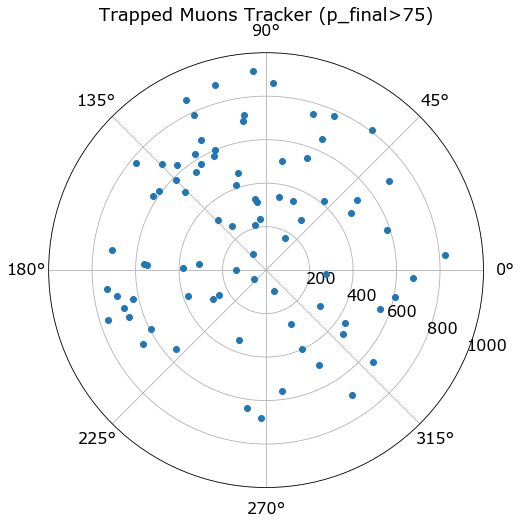

In [20]:
r2_cut = df_mu_r2.query('pstop>75')
theta = np.arctan2(r2_cut.ystop, r2_cut.xstop)
r = np.sqrt(r2_cut.ystop**2+r2_cut.xstop**2)
ax = plt.subplot(111, projection='polar')
ax.plot(theta, r, 'o')
ax.set_rmax(1000)
#ax.set_rticks([0.5, 1, 1.5, 2])  # less radial ticks
ax.set_rlabel_position(-22.5)  # get radial labels away from plotted line
ax.grid(True)

ax.set_title("Trapped Muons Tracker (p_final>75)", va='bottom')

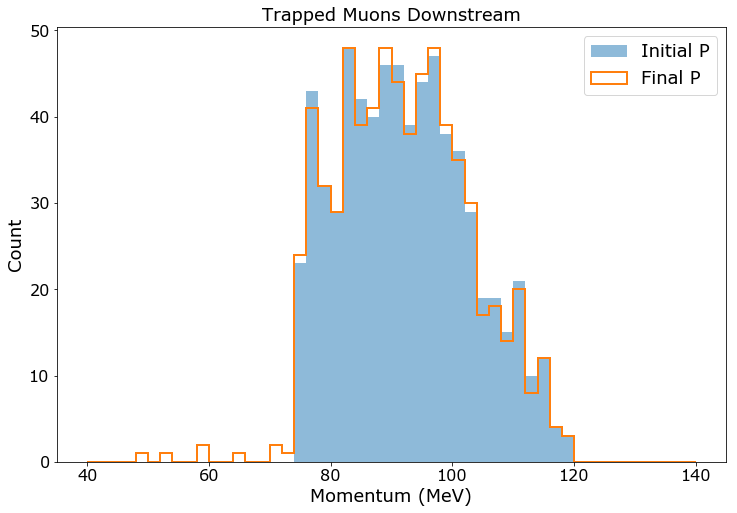

In [26]:
_ = splt.hist(df_mu_r3.p.values, range=(40,140), bins=50, label='Initial P')
_ = splt.hist(df_mu_r3.pstop.values, range=(40,140), bins=50, label='Final P', histtype='step')
plt.legend()
plt.title('Trapped Muons Downstream')
plt.xlabel('Momentum (MeV)')
plt.ylabel('Count')

In [5]:
df_ntpart_ft.query('tstop>690 and pstop>100')

,run,subrun,evt,trk,pdg,time,gtime,x,y,z,...,parent_py,parent_pz,parent_p,parent_pxstop,parent_pystop,parent_pzstop,parent_pstop,parent_code,parent_lastke,runevt
6016,1,233,40830,1,13,0.0,0.0,563.761963,-291.613464,4925.587402,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,23340830
8266,1,320,13674,1,13,0.0,0.0,662.610840,-559.511658,5095.057129,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,32013674
10005,1,388,84487,1,13,0.0,0.0,726.293457,-532.330139,4966.044922,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,38884487
